<a href="https://colab.research.google.com/github/darrickpang/Email/blob/master/747_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget http://www.robots.ox.ac.uk/~vgg/data/fgvc-aircraft/archives/fgvc-aircraft-2013b.tar.gz
!tar -xzf fgvc-aircraft-2013b.tar.gz

--2025-12-16 19:35:06--  http://www.robots.ox.ac.uk/~vgg/data/fgvc-aircraft/archives/fgvc-aircraft-2013b.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.robots.ox.ac.uk/~vgg/data/fgvc-aircraft/archives/fgvc-aircraft-2013b.tar.gz [following]
--2025-12-16 19:35:07--  https://www.robots.ox.ac.uk/~vgg/data/fgvc-aircraft/archives/fgvc-aircraft-2013b.tar.gz
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2753340328 (2.6G) [application/x-gzip]
Saving to: ‘fgvc-aircraft-2013b.tar.gz’

fgvc-aircraft-2013b 100%[===================>]   2.56G  14.4MB/s    in 3m 3s   

2025-12-16 19:38:11 (14.3 MB/s) - ‘fgvc-aircraft-2013b.tar.gz’ saved [2753340328/2753340328]



In [2]:
!pip install -q torch torchvision tqdm

In [3]:
import os
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms

class AircraftDataset(Dataset):
    def __init__(self, split_file, image_dir, class_to_idx, transform=None):
        self.samples = []
        with open(split_file) as f:
            for line in f:
                img, label = line.strip().split(" ", 1)
                self.samples.append((img, label))
        self.image_dir = image_dir
        self.class_to_idx = class_to_idx
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_name, label = self.samples[idx]
        img_path = os.path.join(self.image_dir, img_name + ".jpg")
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, self.class_to_idx[label]

In [4]:
# Read all labels
labels = set()
for split in ["train", "val"]:
    with open(f"fgvc-aircraft-2013b/data/images_variant_{split}.txt") as f:
        for line in f:
            labels.add(line.strip().split(" ", 1)[1])

class_names = sorted(labels)
class_to_idx = {c: i for i, c in enumerate(class_names)}

NUM_CLASSES = len(class_names)
print("Number of aircraft classes:", NUM_CLASSES)

Number of aircraft classes: 100


In [5]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [6]:
import torch
from torchvision import models

device = "cuda" if torch.cuda.is_available() else "cpu"

model = models.resnet50(pretrained=True)
model.fc = torch.nn.Linear(2048, NUM_CLASSES)
model = model.to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 206MB/s]


In [7]:
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim

train_ds = AircraftDataset(
    "fgvc-aircraft-2013b/data/images_variant_train.txt",
    "fgvc-aircraft-2013b/data/images",
    class_to_idx,
    transform
)

val_ds = AircraftDataset(
    "fgvc-aircraft-2013b/data/images_variant_val.txt",
    "fgvc-aircraft-2013b/data/images",
    class_to_idx,
    transform
)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=2)

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=3e-4)

In [8]:
from tqdm import tqdm

EPOCHS = 20

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0

    for imgs, labels in tqdm(train_loader):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {total_loss:.3f}")

100%|██████████| 105/105 [00:52<00:00,  2.01it/s]


Epoch 1/20 | Loss: 373.923


100%|██████████| 105/105 [00:46<00:00,  2.24it/s]


Epoch 2/20 | Loss: 210.382


100%|██████████| 105/105 [00:47<00:00,  2.20it/s]


Epoch 3/20 | Loss: 141.440


100%|██████████| 105/105 [00:46<00:00,  2.26it/s]


Epoch 4/20 | Loss: 98.420


100%|██████████| 105/105 [00:47<00:00,  2.21it/s]


Epoch 5/20 | Loss: 74.362


100%|██████████| 105/105 [00:47<00:00,  2.20it/s]


Epoch 6/20 | Loss: 57.380


100%|██████████| 105/105 [00:46<00:00,  2.27it/s]


Epoch 7/20 | Loss: 41.348


100%|██████████| 105/105 [00:47<00:00,  2.21it/s]


Epoch 8/20 | Loss: 29.568


100%|██████████| 105/105 [00:46<00:00,  2.25it/s]


Epoch 9/20 | Loss: 31.977


100%|██████████| 105/105 [00:46<00:00,  2.27it/s]


Epoch 10/20 | Loss: 31.670


100%|██████████| 105/105 [00:47<00:00,  2.22it/s]


Epoch 11/20 | Loss: 18.333


100%|██████████| 105/105 [00:47<00:00,  2.21it/s]


Epoch 12/20 | Loss: 16.394


100%|██████████| 105/105 [00:46<00:00,  2.26it/s]


Epoch 13/20 | Loss: 19.240


100%|██████████| 105/105 [00:46<00:00,  2.25it/s]


Epoch 14/20 | Loss: 17.852


100%|██████████| 105/105 [00:46<00:00,  2.24it/s]


Epoch 15/20 | Loss: 20.013


100%|██████████| 105/105 [00:46<00:00,  2.26it/s]


Epoch 16/20 | Loss: 15.324


100%|██████████| 105/105 [00:46<00:00,  2.24it/s]


Epoch 17/20 | Loss: 13.353


100%|██████████| 105/105 [00:46<00:00,  2.25it/s]


Epoch 18/20 | Loss: 12.289


100%|██████████| 105/105 [00:46<00:00,  2.25it/s]


Epoch 19/20 | Loss: 6.926


100%|██████████| 105/105 [00:46<00:00,  2.25it/s]

Epoch 20/20 | Loss: 8.688


In [9]:
torch.save(model.state_dict(), "aircraft_classifier_resnet50.pt")

In [10]:
from google.colab import drive
drive.mount("/content/drive")

!cp aircraft_classifier_resnet50.pt /content/drive/MyDrive/

Mounted at /content/drive


# Load Models

In [11]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 72.1 MB/s eta 0:00:00


In [12]:
import torch
import cv2
from ultralytics import YOLO
from torchvision import models, transforms
from PIL import Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [13]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [14]:
detector = YOLO("/content/drive/MyDrive/yolo_person_car_aircraft.pt")

In [15]:
NUM_CLASSES = len(class_names)  # same mapping used in training

classifier = models.resnet50(pretrained=False)
classifier.fc = torch.nn.Linear(2048, NUM_CLASSES)

classifier.load_state_dict(
    torch.load("/content/drive/MyDrive/aircraft_classifier_resnet50.pt",
               map_location="cuda")
)

classifier.eval().cuda()

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [16]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [17]:
image_path = "/content/drive/MyDrive/20231219_145215.jpg"
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

results = detector(img_rgb)[0]

for box in results.boxes:
    cls_id = int(box.cls[0])

    if cls_id == 4:  # airplane
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        # Crop aircraft
        crop = img_rgb[y1:y2, x1:x2]
        pil_crop = Image.fromarray(crop)

        # Classify aircraft
        input_tensor = transform(pil_crop).unsqueeze(0).cuda()

        with torch.no_grad():
            logits = classifier(input_tensor)
            probs = torch.softmax(logits, dim=1)
            pred = probs.argmax(dim=1).item()
            confidence = probs[0, pred].item()

        aircraft_name = class_names[pred]


0: 384x640 1 airplane, 122.0ms
Speed: 13.1ms preprocess, 122.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)


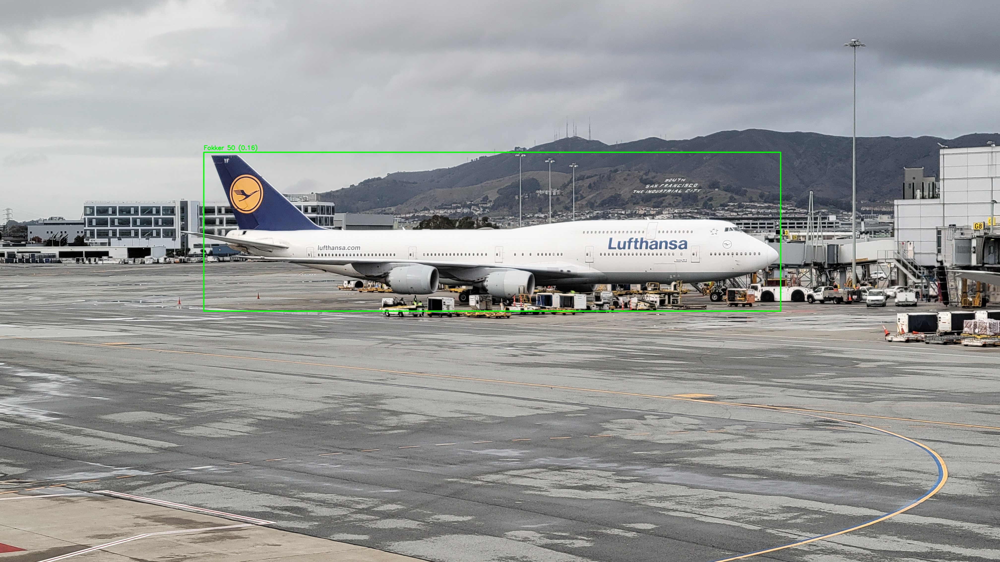

In [20]:
from google.colab.patches import cv2_imshow

label = f"{aircraft_name} ({confidence:.2f})"

cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)
cv2.putText(
    img,
    label,
    (x1, y1 - 10),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.8,
    (0, 255, 0),
    2
)

cv2_imshow(img)